In [1]:
import numpy as np
import pandas as pd
import geopandas as gpd

In [2]:
data = pd.read_csv('https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_confirmed_global.csv')


In [3]:
data.head()

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,...,6/1/20,6/2/20,6/3/20,6/4/20,6/5/20,6/6/20,6/7/20,6/8/20,6/9/20,6/10/20
0,NaN,Afghanistan,33.0000,65.0000,0,0,0,0,0,0,...,15750,16509,17267,18054,18969,19551,20342,20917,21459,22142
1,NaN,Albania,41.1533,20.1683,0,0,0,0,0,0,...,1143,1164,1184,1197,1212,1232,1246,1263,1299,1341
2,NaN,Algeria,28.0339,1.6596,0,0,0,0,0,0,...,9513,9626,9733,9831,9935,10050,10154,10265,10382,10484
3,NaN,Andorra,42.5063,1.5218,0,0,0,0,0,0,...,765,844,851,852,852,852,852,852,852,852
4,NaN,Angola,-11.2027,17.8739,0,0,0,0,0,0,...,86,86,86,86,86,88,91,92,96,113


In [4]:
#grouping data by country
data = data.groupby('Country/Region').sum()

In [5]:
data.shape

(188, 143)

In [6]:
data.head()

,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,...,6/1/20,6/2/20,6/3/20,6/4/20,6/5/20,6/6/20,6/7/20,6/8/20,6/9/20,6/10/20
Country/Region,,,,,,,,,,,,,,,,,,,,,
Afghanistan,33.0000,65.0000,0,0,0,0,0,0,0,0,...,15750,16509,17267,18054,18969,19551,20342,20917,21459,22142
Albania,41.1533,20.1683,0,0,0,0,0,0,0,0,...,1143,1164,1184,1197,1212,1232,1246,1263,1299,1341
Algeria,28.0339,1.6596,0,0,0,0,0,0,0,0,...,9513,9626,9733,9831,9935,10050,10154,10265,10382,10484
Andorra,42.5063,1.5218,0,0,0,0,0,0,0,0,...,765,844,851,852,852,852,852,852,852,852
Angola,-11.2027,17.8739,0,0,0,0,0,0,0,0,...,86,86,86,86,86,88,91,92,96,113


In [7]:
#drop Lat and Long
data.drop(columns = ['Lat', 'Long'], inplace=True)

In [8]:
#create a transpose of the dataframe
data_transposed = data.T

In [9]:
data_transposed.head()

Country/Region,Afghanistan,Albania,Algeria,Andorra,Angola,Antigua and Barbuda,Argentina,Armenia,Australia,Austria,...,United Kingdom,Uruguay,Uzbekistan,Venezuela,Vietnam,West Bank and Gaza,Western Sahara,Yemen,Zambia,Zimbabwe
1/22/20,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1/23/20,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,2,0,0,0,0,0
1/24/20,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,2,0,0,0,0,0
1/25/20,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,2,0,0,0,0,0
1/26/20,0,0,0,0,0,0,0,0,4,0,...,0,0,0,0,2,0,0,0,0,0


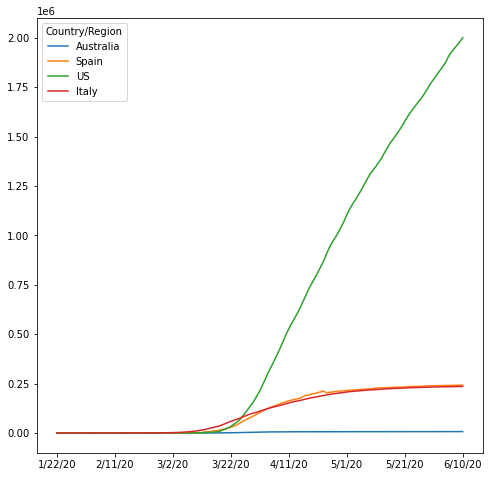

In [10]:
data_transposed.plot(y = ['Australia','Spain','US','Italy'], use_index=True, figsize=(8,8))

In [11]:
#read in the world map shapefile
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))

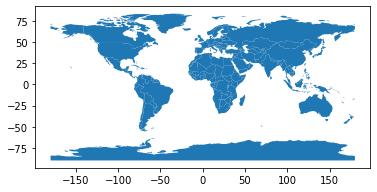

In [12]:
world.plot()

In [13]:
type(world)

geopandas.geodataframe.GeoDataFrame

In [14]:
with pd.option_context('display.max_rows', None, 'display.max_columns', None):  # more options can be specified also
    print(world)

        pop_est                continent                      name iso_a3  \
0        920938                  Oceania                      Fiji    FJI   
1      53950935                   Africa                  Tanzania    TZA   
2        603253                   Africa                 W. Sahara    ESH   
3      35623680            North America                    Canada    CAN   
4     326625791            North America  United States of America    USA   
5      18556698                     Asia                Kazakhstan    KAZ   
6      29748859                     Asia                Uzbekistan    UZB   
7       6909701                  Oceania          Papua New Guinea    PNG   
8     260580739                     Asia                 Indonesia    IDN   
9      44293293            South America                 Argentina    ARG   
10     17789267            South America                     Chile    CHL   
11     83301151                   Africa           Dem. Rep. Congo    COD   

In [15]:
world

,pop_est,continent,name,iso_a3,gdp_md_est,geometry
0,920938,Oceania,Fiji,FJI,8374.0,"MULTIPOLYGON (((180.00000 -16.06713, 180.00000..."
1,53950935,Africa,Tanzania,TZA,150600.0,"POLYGON ((33.90371 -0.95000, 34.07262 -1.05982..."
2,603253,Africa,W. Sahara,ESH,906.5,"POLYGON ((-8.66559 27.65643, -8.66512 27.58948..."
3,35623680,North America,Canada,CAN,1674000.0,"MULTIPOLYGON (((-122.84000 49.00000, -122.9742..."
4,326625791,North America,United States of America,USA,18560000.0,"MULTIPOLYGON (((-122.84000 49.00000, -120.0000..."
...,...,...,...,...,...,...
172,7111024,Europe,Serbia,SRB,101800.0,"POLYGON ((18.82982 45.90887, 18.82984 45.90888..."
173,642550,Europe,Montenegro,MNE,10610.0,"POLYGON ((20.07070 42.58863, 19.80161 42.50009..."
174,1895250,Europe,Kosovo,-99,18490.0,"POLYGON ((20.59025 41.85541, 20.52295 42.21787..."
175,1218208,North America,Trinidad and Tobago,TTO,43570.0,"POLYGON ((-61.68000 10.76000, -61.10500 10.890..."


In [16]:
world.replace('United States of America', 'US', inplace=True)
world.replace('Bosnia and Herzegovinais', 'Bosnia and Herz.', inplace=True)
world.replace('South Korea', 'Korea, South', inplace=True)
world.replace('Dominican Republicis', 'Dominican Rep.', inplace=True)
world.replace('Western Saharais', 'W. Sahara', inplace=True)
world.replace('Mauritania', 'Mauritiusis', inplace=True)
world.replace('eSwatini', 'Eswatiniis', inplace=True)
world.replace('Eq. Guinea', 'Equatorial Guineais', inplace=True)
world.replace('S. Sudan', 'South Sudanis', inplace=True)
world.replace('Central African Rep.', 'Central African Republicis', inplace=True)


In [17]:
#check to see if the shapefile will match the datafile
for index, row in data.iterrows():
    if index not in world['name'].to_list():
        print(index+'is not in list')
    else:
        pass

Andorrais not in list
Antigua and Barbudais not in list
Bahrainis not in list
Barbadosis not in list
Bosnia and Herzegovinais not in list
Burmais not in list
Cabo Verdeis not in list
Central African Republicis not in list
Comorosis not in list
Congo (Brazzaville)is not in list
Congo (Kinshasa)is not in list
Cote d'Ivoireis not in list
Diamond Princessis not in list
Dominicais not in list
Dominican Republicis not in list
Equatorial Guineais not in list
Eswatiniis not in list
Grenadais not in list
Holy Seeis not in list
Liechtensteinis not in list
MS Zaandamis not in list
Maldivesis not in list
Maltais not in list
Mauritaniais not in list
Mauritiusis not in list
Monacois not in list
North Macedoniais not in list
Saint Kitts and Nevisis not in list
Saint Luciais not in list
Saint Vincent and the Grenadinesis not in list
San Marinois not in list
Sao Tome and Principeis not in list
Seychellesis not in list
Singaporeis not in list
South Sudanis not in list
Taiwan*is not in list
West Bank and

In [18]:
#merge the sources

merge = world.join(data, on='name', how='right')

In [19]:
merge.head()

,pop_est,continent,name,iso_a3,gdp_md_est,geometry,1/22/20,1/23/20,1/24/20,1/25/20,...,6/1/20,6/2/20,6/3/20,6/4/20,6/5/20,6/6/20,6/7/20,6/8/20,6/9/20,6/10/20
0.0,920938.0,Oceania,Fiji,FJI,8374.0,"MULTIPOLYGON (((180.00000 -16.06713, 180.00000...",0,0,0,0,...,18,18,18,18,18,18,18,18,18,18
1.0,53950935.0,Africa,Tanzania,TZA,150600.0,"POLYGON ((33.90371 -0.95000, 34.07262 -1.05982...",0,0,0,0,...,509,509,509,509,509,509,509,509,509,509
3.0,35623680.0,North America,Canada,CAN,1674000.0,"MULTIPOLYGON (((-122.84000 49.00000, -122.9742...",0,0,0,0,...,93288,93960,94641,95269,95947,96475,97178,97779,98241,98720
4.0,326625791.0,North America,US,USA,18560000.0,"MULTIPOLYGON (((-122.84000 49.00000, -120.0000...",1,1,2,2,...,1811020,1831821,1851520,1872660,1902632,1925765,1943882,1961428,1979489,2000464
5.0,18556698.0,Asia,Kazakhstan,KAZ,460700.0,"POLYGON ((87.35997 49.21498, 86.59878 48.54918...",0,0,0,0,...,11308,11571,12067,12067,12312,12511,12694,12859,13074,13319


In [39]:
len(merge.columns.to_list())

147

/opt/miniconda3/envs/conda_env/lib/python3.8/site-packages/geopandas/plotting.py:525: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)
/opt/miniconda3/envs/conda_env/lib/python3.8/site-packages/geopandas/plotting.py:525: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)
/opt/miniconda3/envs/conda_env/lib/python3.8/site-packages/geopandas/plotting.py:525: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.

/opt/miniconda3/envs/conda_env/lib/python3.8/site-packages/geopandas/plotting.py:525: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)
/opt/miniconda3/envs/conda_env/lib/python3.8/site-packages/geopandas/plotting.py:525: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)
/opt/miniconda3/envs/conda_env/lib/python3.8/site-packages/geopandas/plotting.py:525: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.

/opt/miniconda3/envs/conda_env/lib/python3.8/site-packages/geopandas/plotting.py:525: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)
/opt/miniconda3/envs/conda_env/lib/python3.8/site-packages/geopandas/plotting.py:525: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)
/opt/miniconda3/envs/conda_env/lib/python3.8/site-packages/geopandas/plotting.py:525: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.

/opt/miniconda3/envs/conda_env/lib/python3.8/site-packages/geopandas/plotting.py:525: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)
/opt/miniconda3/envs/conda_env/lib/python3.8/site-packages/geopandas/plotting.py:525: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)
/opt/miniconda3/envs/conda_env/lib/python3.8/site-packages/geopandas/plotting.py:525: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.

/opt/miniconda3/envs/conda_env/lib/python3.8/site-packages/geopandas/plotting.py:525: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)
/opt/miniconda3/envs/conda_env/lib/python3.8/site-packages/geopandas/plotting.py:525: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)
/opt/miniconda3/envs/conda_env/lib/python3.8/site-packages/geopandas/plotting.py:525: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.

/opt/miniconda3/envs/conda_env/lib/python3.8/site-packages/geopandas/plotting.py:525: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)
/opt/miniconda3/envs/conda_env/lib/python3.8/site-packages/geopandas/plotting.py:525: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)
/opt/miniconda3/envs/conda_env/lib/python3.8/site-packages/geopandas/plotting.py:525: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.

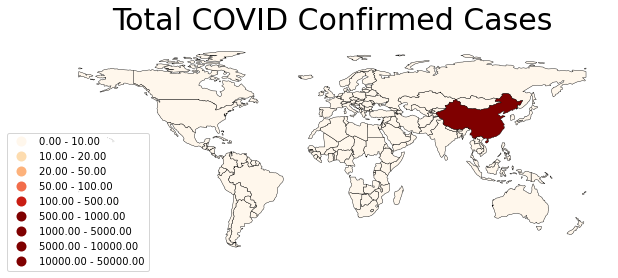

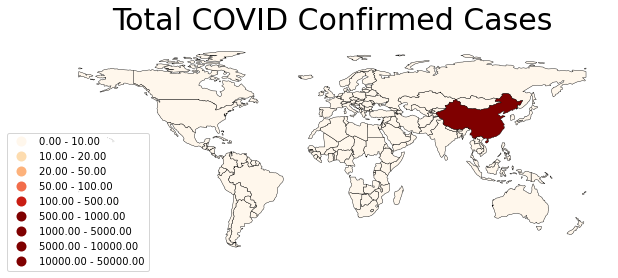

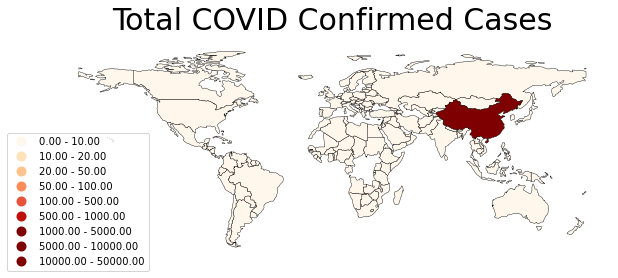

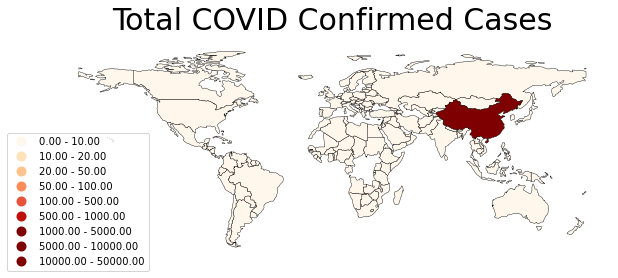

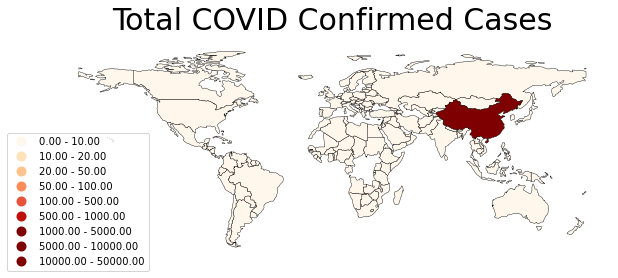

...

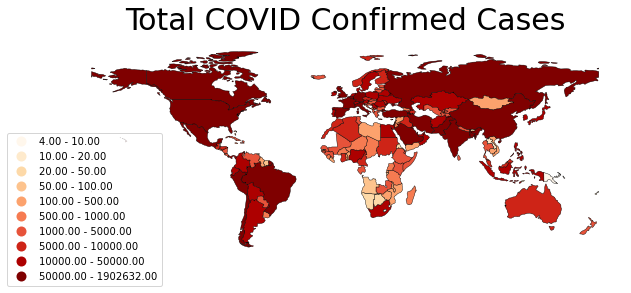

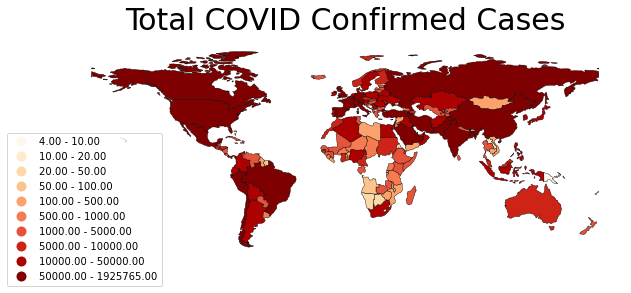

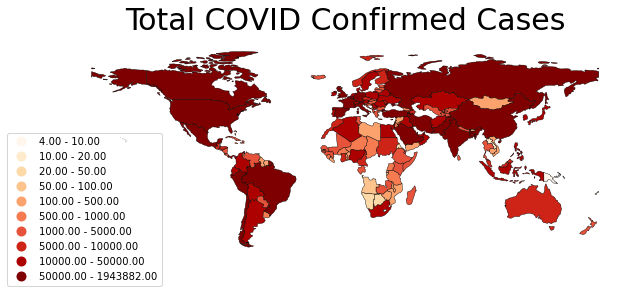

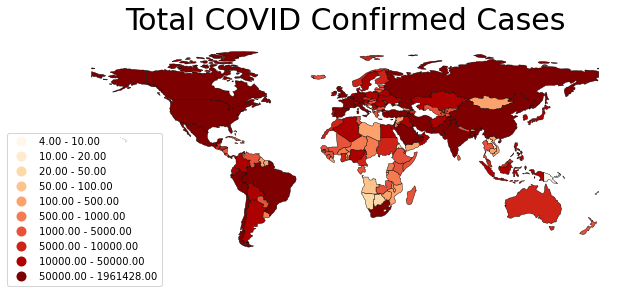

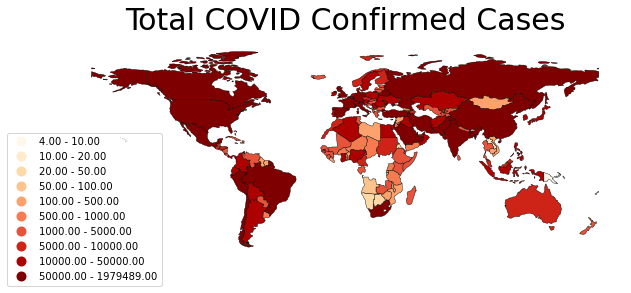

In [50]:
image_frames = []

for dates in merge.columns.to_list()[7:146]:

    ax = merge.plot(column=dates,
                   cmap = 'OrRd',
                   figsize = (10,10),
                    legend = True,
                    scheme = 'user_defined',
                    classification_kwds = {'bins':[10, 20, 50, 100, 500, 1000, 5000, 10000, 50000]},
                    edgecolor = 'black',
                    linewidth = 0.4)
    ax.set_title('Total COVID Confirmed Cases', fontdict = {'fontsize':30}, pad=12.0)

    #axis off
    ax.set_axis_off()

    #move legend
    ax.get_legend().set_bbox_to_anchor((0.18, 0.6))
    
    img = ax.get_figure()
    
    f= io.BytesIO()
    img.savefig(f, format ='png', bbox ='right')
    f.seek(0)
    image_frames.append(PIL.Image.open(f))


#create GIF file
image_frames[0].save('Dynamic COVID.gif', format ='GIF',
            append_images = image_frames[1:],
            save_all = True, duration = 300,
            loop =1)

f.close()

In [44]:
import PIL
import io

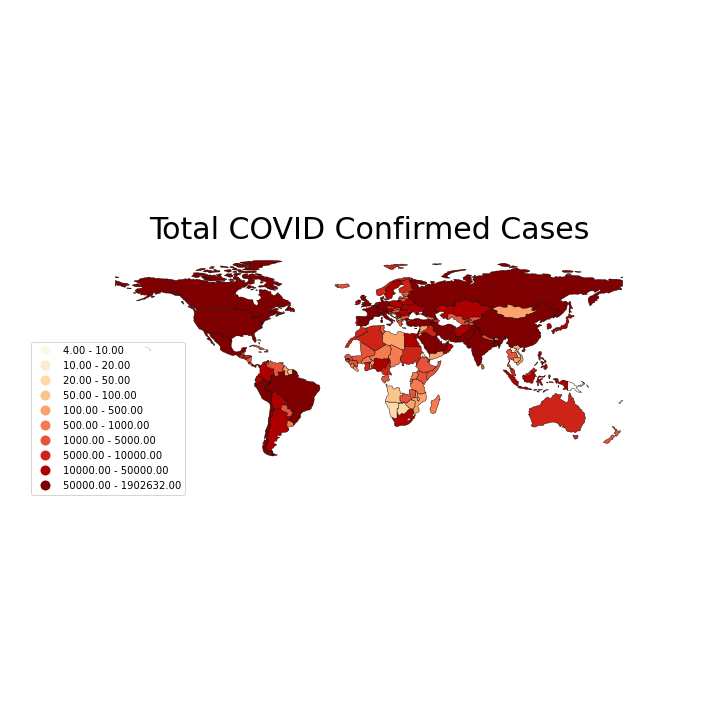

In [49]:
image_frames[1]